- **Download dataset**

In [2]:
!gdown https://drive.google.com/file/d/1EUYiGqgu5InaSk7ZLeWIG64673tveElF/view?usp=drive_link --fuzzy
!unzip numpy_files.zip

Downloading...
From (original): https://drive.google.com/uc?id=1EUYiGqgu5InaSk7ZLeWIG64673tveElF
From (redirected): https://drive.google.com/uc?id=1EUYiGqgu5InaSk7ZLeWIG64673tveElF&confirm=t&uuid=c0f7f7c5-ac10-46f1-8088-4244139e5e72
To: /content/numpy_files.zip
100% 183M/183M [00:01<00:00, 94.3MB/s]
Archive:  numpy_files.zip
   creating: numpy_files/
   creating: numpy_files/split_data/
  inflating: numpy_files/split_data/split_images.npz  
  inflating: numpy_files/split_data/split_image_name.npz  
  inflating: numpy_files/split_data/split_gray_feature.npz  
  inflating: numpy_files/split_data/split_canny_feature.npz  
  inflating: numpy_files/split_data/split_local_binary_pattern_feature.npz  
  inflating: numpy_files/split_data/split_cardboard_class.npz  
  inflating: numpy_files/split_data/split_bbox.npz  
  inflating: numpy_files/split_data/split_segmentation.npz  
  inflating: numpy_files/split_data/split_segmentation_category.npz  
 extracting: numpy_files/image_name.npz  
  infl

In [28]:
import cv2
import numpy as np
import os
import tensorflow as tf
import matplotlib.pyplot as plt

## Load dataset

In [ ]:
images = np.load("numpy_files/split_data/split_images.npz")
image_name = np.load("numpy_files/split_data/split_image_name.npz", allow_pickle=True)
cardboard_class = np.load("numpy_files/split_data/split_cardboard_class.npz")
bbox = np.load("numpy_files/split_data/split_bbox.npz")
segmentation = np.load("numpy_files/split_data/split_segmentation.npz")
segmentation_category = np.load("numpy_files/split_data/split_segmentation_category.npz")

- Ubah shape data `images` (n, 1, 300, 400, 3) -> (n, 300, 400, 3)
- Ubah shape data `cardboard_class` (n, 1, 2) -> (n, 2) 
- Ubah shape data `segmentation` (n, 5, 300, 400) -> (n, 300, 400, 5)
- Sekedar mengingatkan 1 data `segmentation` memiliki 5 channel, diantaranya:
  - background kardus
  - bagian kardus yang tidak ada kerusakan
  - kerusakan bertipe *hilang*
  - kerusakan bertipe *penyok*
  - kerusakan bertipe *robek*
- Gabungkan setiap data tipe kerusakan jadi 1, dan jadikan sebagai data utamanya. Jadi 1 citra akan memiliki data `segmentation` dengan shape (300, 400, 1)

In [ ]:
# buat variabel temporary
temp_images = {}
temp_cardboard_class = {}
temp_segmentation = {}

# buat iterasi setiap subset (train, test, val)
for i in images.keys():

    # hilangkan dimensi pada axis=1 pada citra
    temp_images[i] = np.squeeze(images[i], axis=1)

    # reshape data cardboard_class menjadi (n, 2)
    temp_cardboard_class[i] = cardboard_class[i].reshape(-1, 2)

    # ubah posisi channel pada segmentasi menjadi posisi terakhir
    temp_segmentation[i] = np.transpose(segmentation[i], [0, 2, 3, 1])

    # buat masking full hitam
    temp_segmentation[i][..., 1] = np.zeros(temp_segmentation[i].shape[:-1])

    # iterasi setiap index pada data segmentasi yang berisi tipe kerusakan
    for j in [2, 3, 4]:

        # gabungkan jadi 1 setiap tipe kerusakan pada masking full hitam tadi dengan logical or
        temp_segmentation[i][..., 1] = np.logical_or(
            temp_segmentation[i][..., 1], temp_segmentation[i][..., j]
        )

    # jadikan gabungan tadi menjadi data utama
    temp_segmentation[i] = temp_segmentation[i][..., [1]]

# kembalikan ke variabel asalnya
images = temp_images
cardboard_class = temp_cardboard_class
segmentation = temp_segmentation

In [ ]:
# hapus variabel temporary dari memori
del temp_images
del temp_cardboard_class
del temp_segmentation

In [ ]:
# cek shape data segmentasi
segmentation["test"].shape

(37, 300, 400, 1)

## Pembuatan Model UNet

- `conv_block` : membuat blok konvolusi untuk pembentukan artitektur UNet
- `down_sampling` : berisi layer max_pooling untuk down_sampling
- `up_sampling` : berisi layer conv2dtranspose untuk up_sampling
- `crop_and_concat` : menyamakan shape `src` ke `dst`, lalu ditambahkan kedua itu

![Arsitektur UNet](https://nn.labml.ai/unet/unet.png)

In [ ]:
# define posisi channel pada citra dan segmentasi
IMAGE_ORDERING = "channels_last"


# buat fungsi untuk pembuatan blok konvolusi yang terdiri dari layer Conv2D dan Aktivasi ReLU 2 rangkap
def conv_block(input, filters, kernel=3):
    x = tf.keras.layers.Conv2D(
        filters,
        kernel,
        kernel_initializer="he_normal",
        padding="same",
        data_format=IMAGE_ORDERING,
    )(input)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv2D(
        filters,
        kernel,
        kernel_initializer="he_normal",
        padding="same",
        data_format=IMAGE_ORDERING,
    )(x)
    x = tf.keras.layers.ReLU()(x)
    return x


# buat fungsi untuk pembuatan layer untuk down sampling sebanyak 2x, misal shape (100, 100) -> (50, 50)
def down_sampling(input):
    return tf.keras.layers.MaxPool2D(2)(input)


# buat fungsi untuk pembuatan layer untuk up sampling sebanyak 2x, misal shape (50, 50) -> (100, 100)
def up_sampling(input, filters):
    return tf.keras.layers.Conv2DTranspose(filters, kernel_size=2, strides=2)(input)


# resize data y agar memiliki shape sama dengan x, lalu tambahkan x dan y
def crop_and_concat(x, y):
    target_height, target_width = x.shape[1], x.shape[2]
    y = tf.keras.layers.Resizing(target_height, target_width)(y)
    return tf.keras.layers.Concatenate(axis=-1)([x, y])

In [ ]:
# fungsi untuk pembentukan
def UNet(input_height=300, input_width=400, channel=3, num_classes=1):

    # buat layer input untuk menerima input-an citra
    img_input = tf.keras.layers.Input(shape=(input_height, input_width, channel))

    # buat blok pertama dengan downsamplingnya
    b1 = conv_block(img_input, 32)
    ds1 = down_sampling(b1)

    # buat blok kedua dengan downsamplingnya
    b2 = conv_block(ds1, 64)
    ds2 = down_sampling(b2)

    # buat blok ketiga dengan downsamplingnya
    b3 = conv_block(ds2, 128)
    ds3 = down_sampling(b3)

    # buat blok keempat dengan downsamplingnya
    b4 = conv_block(ds3, 256)
    ds4 = down_sampling(b4)

    # buat blok bottleneck
    b5 = conv_block(ds4, 512)

    # upsampling blok bootleneck
    us5 = up_sampling(b5, 256)
    # samakan shape upsampling dengan blok ke 4 lalu tambahkan
    crop5 = crop_and_concat(b4, us5)
    # buat block keenam
    b6 = conv_block(crop5, 256)

    # upsampling blok keenam
    us6 = up_sampling(b6, 128)
    # samakan shape upsampling dengan blok ke 3 lalu tambahkan
    crop6 = crop_and_concat(b3, us6)
    # buat block ketujuh
    b7 = conv_block(crop6, 128)

    # upsampling blok ketujuh
    us7 = up_sampling(b7, 64)
    # samakan shape upsampling dengan blok ke 2 lalu tambahkan
    crop7 = crop_and_concat(b2, us7)
    # buat block kedelapan
    b8 = conv_block(crop7, 64)

    # upsampling blok kedelapan
    us8 = up_sampling(b8, 32)
    # samakan shape upsampling dengan blok ke 1 lalu tambahkan
    crop8 = crop_and_concat(b1, us8)
    # buat block kesembilan
    b9 = conv_block(crop8, 32)

    # buat output untuk segmentasi dengan aktivasi sigmoid
    segmentation_output = tf.keras.layers.Conv2D(
        num_classes,
        kernel_size=1,
        data_format=IMAGE_ORDERING,
        activation="sigmoid",
        name="segmentation_output",
    )(b9)

    return segmentation_output, img_input

In [ ]:
# buat model untuk klasifikasi kelas kardus
def class_clasifier(input, num_classes=2):
    x = tf.keras.layers.Conv2D(32, (3, 3), activation="relu")(input)
    x = tf.keras.layers.MaxPooling2D((2, 2))(x)
    x = tf.keras.layers.Conv2D(64, (3, 3), activation="relu")(x)
    x = tf.keras.layers.MaxPooling2D((2, 2))(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(256, activation="relu")(x)
    class_output = tf.keras.layers.Dense(num_classes, activation="softmax", name="class_output")(x)

    return class_output

## Pembuatan Model

In [ ]:
# inisialiasi model untuk segmentasi dan klasifikasi kelas
segmentation_output, img_input = UNet()
class_output = class_clasifier(img_input)

# jadikan 1 dengan citra sebagai input dan output akan berupa segmentasi dan kelas kardus
model = tf.keras.Model(
    inputs=img_input,
    outputs={
        "segmentation_output": segmentation_output,
        "class_output": class_output,
    },
)

In [ ]:
# tampilkan ringkasan model
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 300, 400, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 300, 400, 32)   │            896 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu (ReLU)              │ (None, 300, 400, 32)   │              0 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 300, 400, 32)   │          9,248 │ re_lu[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_1 (ReLU)            │ (None, 300, 400, 32)   │              0 │ conv2d_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 150, 200, 32)   │              0 │ re_lu_1[0][0]          │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 150, 200, 64)   │         18,496 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_2 (ReLU)            │ (None, 150, 200, 64)   │              0 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 150, 200, 64)   │         36,928 │ re_lu_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_3 (ReLU)            │ (None, 150, 200, 64)   │              0 │ conv2d_3[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 75, 100, 64)    │              0 │ re_lu_3[0][0]          │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 75, 100, 128)   │         73,856 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_4 (ReLU)            │ (None, 75, 100, 128)   │              0 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 75, 100, 128)   │        147,584 │ re_lu_4[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_5 (ReLU)            │ (None, 75, 100, 128)   │              0 │ conv2d_5[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 37, 50, 128)    │              0 │ re_lu_5[0][0]          │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 37, 50, 256)    │        295,168 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_6 (ReLU)            │ (None, 37, 50, 256)    │              0 │ conv2d_6[0][0]         │
├──────────────────────

 Total params: 124,991,651 (476.81 MB)

 Trainable params: 124,991,523 (476.80 MB)

 Non-trainable params: 128 (512.00 B)

In [ ]:
# tampilkan plot model
tf.keras.utils.plot_model(model,show_shapes=True,
    show_layer_names=True,
)

## Hyperparameter

In [ ]:
EPOCHS = 25
BATCH_SIZE = 4
LR = 1e-4

## Proses Training Model

In [ ]:
model.compile(
    # set loss untuk masing masing output
    loss={
        "segmentation_output": "binary_crossentropy",
        "class_output": "categorical_crossentropy",
    },
    metrics ={
        "segmentation_output": ["accuracy"],
        "class_output": ["accuracy"],
        }
    ,
    # pakai optimizer adam dengan learning rate pada hyperparameter
    optimizer=tf.keras.optimizers.Adam(learning_rate=LR)
)

In [ ]:
# train model
history = model.fit(
    images['train'],
    {
        "segmentation_output": segmentation['train'],
        "class_output": cardboard_class['train'],
    },
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    validation_data=(images['val'], {
        "segmentation_output": segmentation['val'],
        "class_output": cardboard_class['val'],
    })
)

Epoch 1/25
74/74 ━━━━━━━━━━━━━━━━━━━━ 100s 865ms/step - class_output_accuracy: 0.6161 - class_output_loss: 4.1433 - loss: 4.3755 - segmentation_output_accuracy: 0.9662 - segmentation_output_loss: 0.2321 - val_class_output_accuracy: 0.4865 - val_class_output_loss: 0.6953 - val_loss: 0.7419 - val_segmentation_output_accuracy: 0.9879 - val_segmentation_output_loss: 0.0637
Epoch 2/25
74/74 ━━━━━━━━━━━━━━━━━━━━ 64s 209ms/step - class_output_accuracy: 0.8215 - class_output_loss: 0.4013 - loss: 0.4564 - segmentation_output_accuracy: 0.9900 - segmentation_output_loss: 0.0550 - val_class_output_accuracy: 0.8378 - val_class_output_loss: 0.5904 - val_loss: 0.6445 - val_segmentation_output_accuracy: 0.9879 - val_segmentation_output_loss: 0.0574
Epoch 3/25
74/74 ━━━━━━━━━━━━━━━━━━━━ 21s 210ms/step - class_output_accuracy: 0.9323 - class_output_loss: 0.1732 - loss: 0.2277 - segmentation_output_accuracy: 0.9895 - segmentation_output_loss: 0.0544 - val_class_output_accuracy: 0.8378 - val_class_output_

## Evaluasi Model

In [ ]:
# tampilkan data histori train yang tersimpan
history.history.keys()

dict_keys(['class_output_accuracy', 'class_output_loss', 'loss', 'segmentation_output_accuracy', 'segmentation_output_loss', 'val_class_output_accuracy', 'val_class_output_loss', 'val_loss', 'val_segmentation_output_accuracy', 'val_segmentation_output_loss'])

In [ ]:
# ambil metrics loss dan akurasi train dan validasi untuk masing masing output
class_output_metrics = {'accuracy':history.history['class_output_accuracy'], 'loss':history.history['class_output_loss']}
val_class_output_metrics = {'accuracy':history.history['val_class_output_accuracy'], 'loss':history.history['val_class_output_loss']}
segmentation_output_metrics = {'accuracy':history.history['segmentation_output_accuracy'], 'loss':history.history['segmentation_output_loss']}
val_segmentation_output_metrics = {'accuracy':history.history['val_segmentation_output_accuracy'], 'loss':history.history['val_segmentation_output_loss']}

### Plot hasil histori train dan validasi

Text(0.5, 1.0, 'Segmentation Loss')

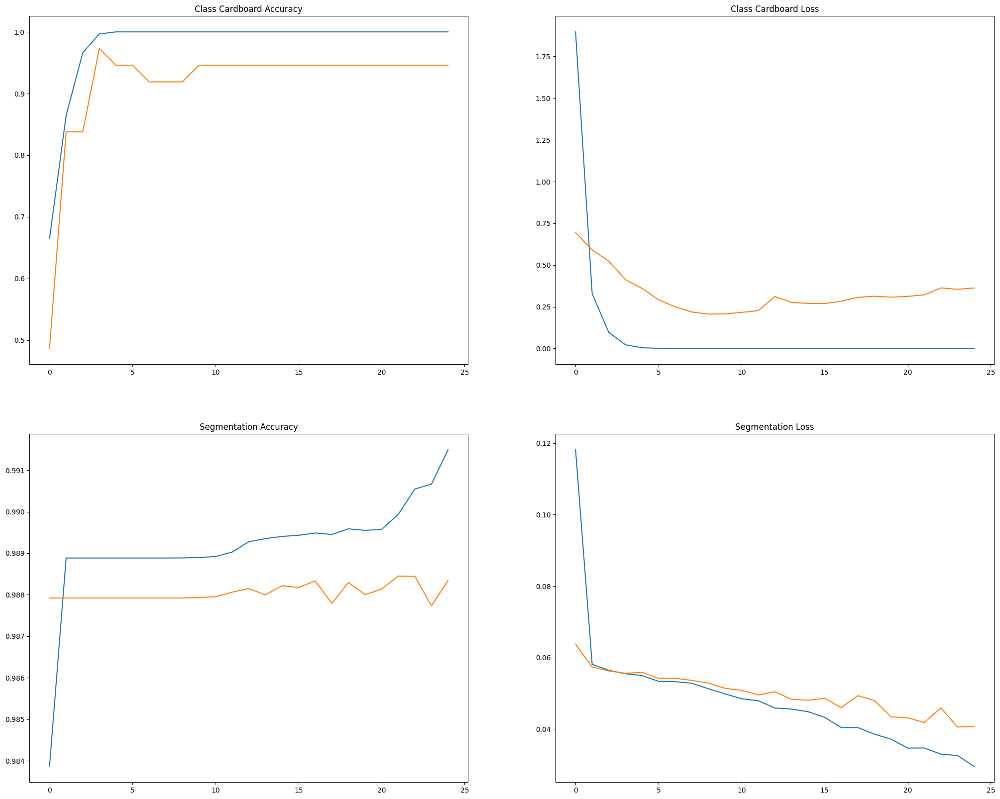

In [ ]:
fig,ax = plt.subplots(2,2,figsize=(25,20))

ax[0][0].plot(class_output_metrics['accuracy'])
ax[0][0].plot(val_class_output_metrics['accuracy'])
ax[0][0].set_title('Class Cardboard Accuracy')

ax[0][1].plot(class_output_metrics["loss"])
ax[0][1].plot(val_class_output_metrics["loss"])
ax[0][1].set_title('Class Cardboard Loss')

ax[1][0].plot(segmentation_output_metrics['accuracy'])
ax[1][0].plot(val_segmentation_output_metrics['accuracy'])
ax[1][0].set_title('Segmentation Accuracy')

ax[1][1].plot(segmentation_output_metrics['loss'])
ax[1][1].plot(val_segmentation_output_metrics['loss'])
ax[1][1].set_title('Segmentation Loss')

### Classification Report dan Confussion Matrix

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

y_true = np.argmax(cardboard_class['test'], axis=1)
y_pred = np.argmax(model.predict(images['test'], batch_size=BATCH_SIZE)['class_output'], axis=1)

print(classification_report(y_true, y_pred, target_names=['normal', 'defect']))

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step
              precision    recall  f1-score   support

      normal       0.81      0.94      0.87        18
      defect       0.94      0.79      0.86        19

    accuracy                           0.86        37
   macro avg       0.87      0.87      0.86        37
weighted avg       0.88      0.86      0.86        37



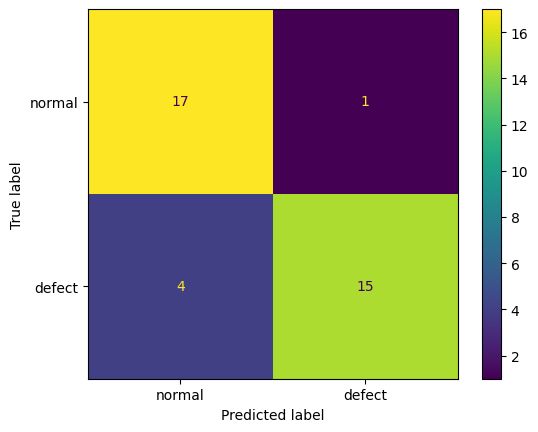

In [ ]:
cm = confusion_matrix(y_true, y_pred)
ConfusionMatrixDisplay(cm, display_labels=['normal', 'defect']).plot()

### Visualisasi Hasil Prediksi

In [ ]:
# generate prediksi pada data test
result = model.predict(images['test'], batch_size=BATCH_SIZE)

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step


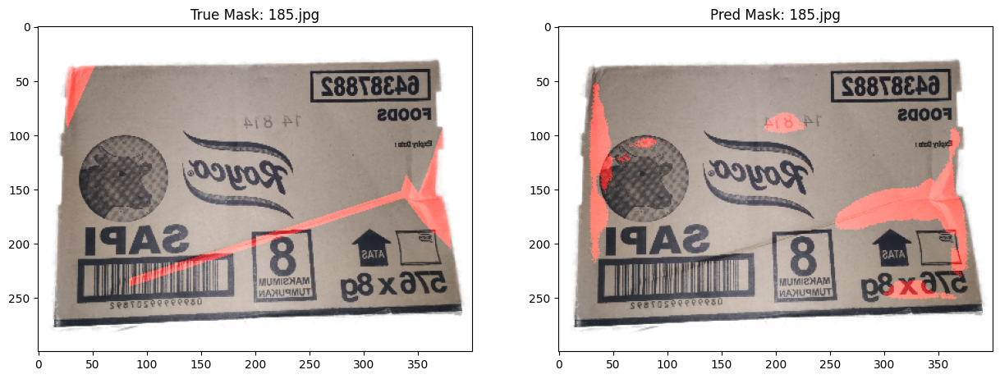

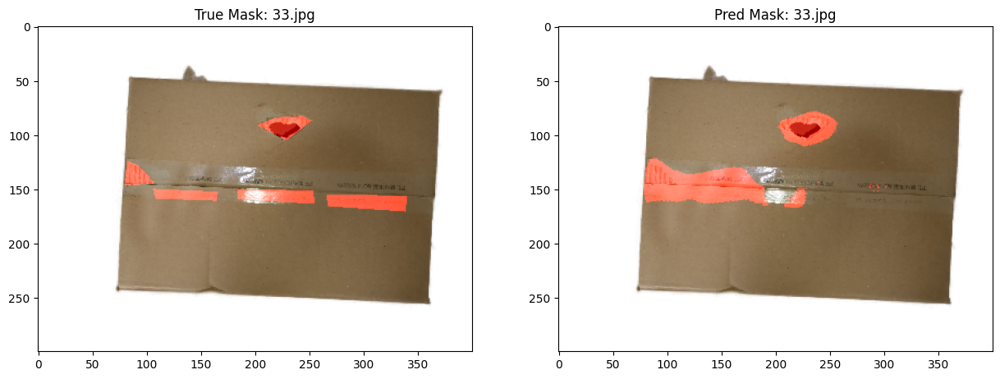

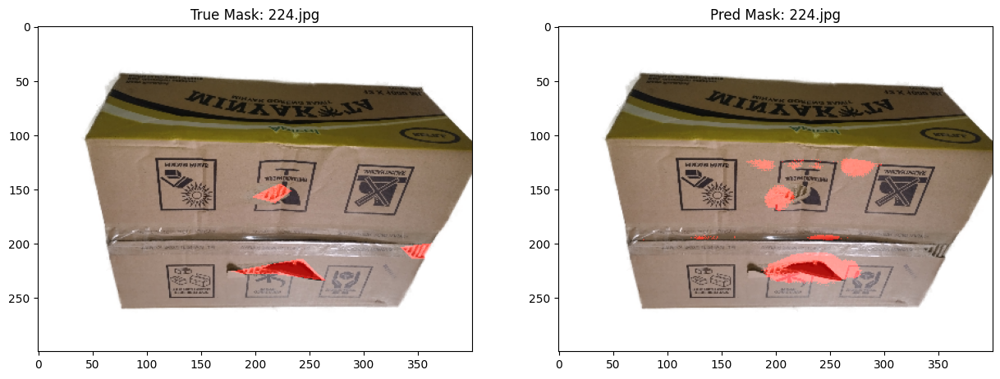

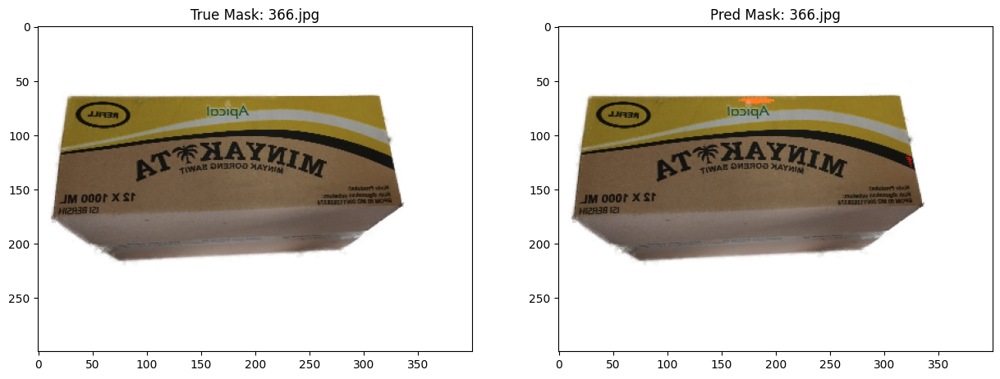

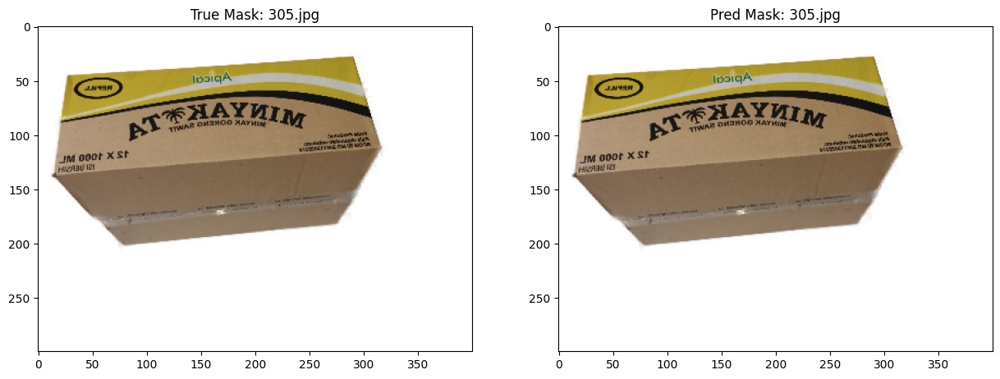

...

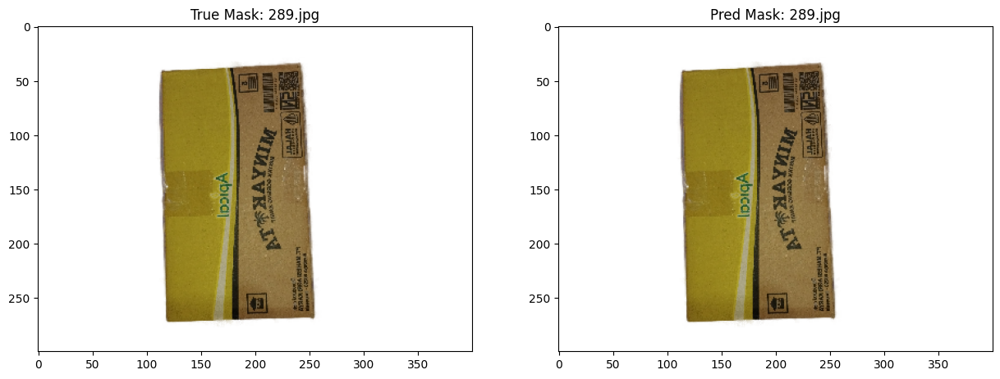

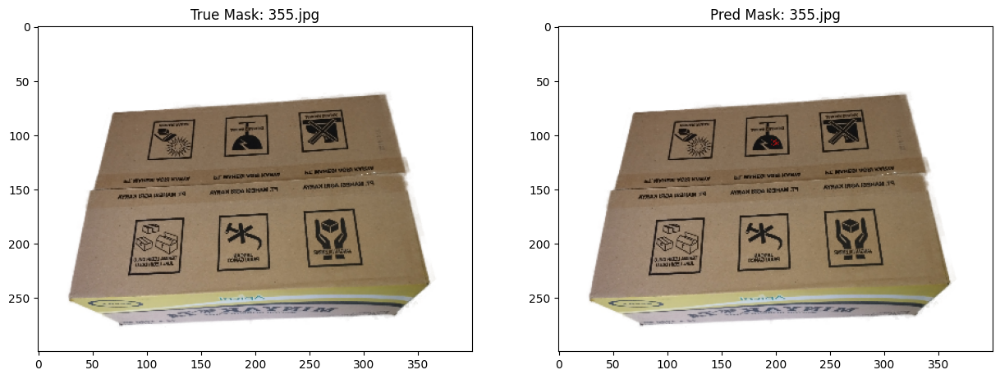

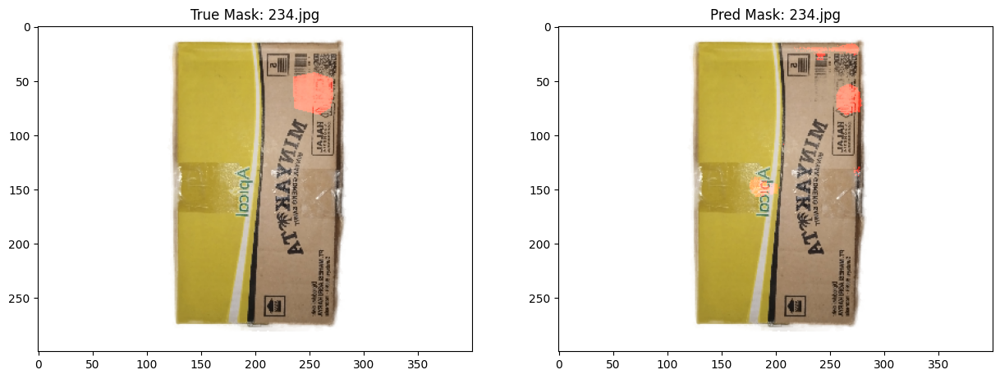

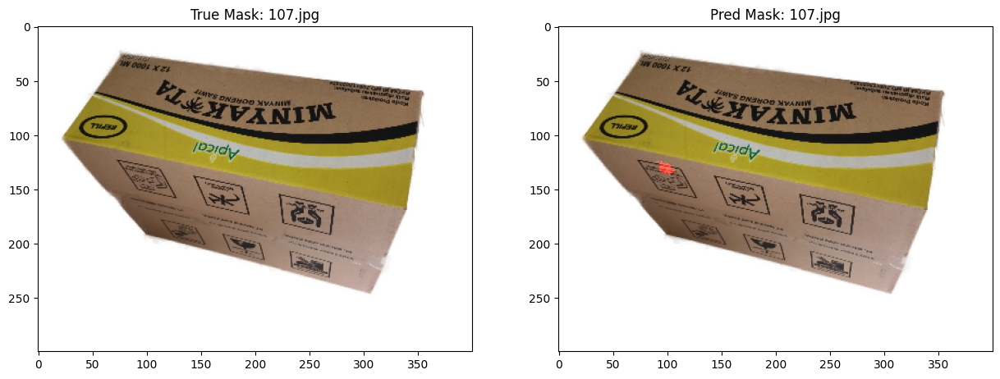

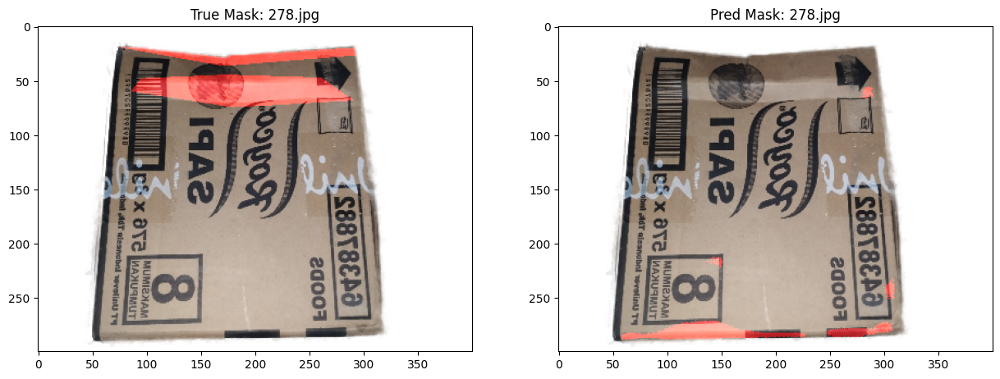

In [ ]:
# iterasi setiap citra pada subset test
for i, im_name in enumerate(image_name["test"]):

    # load citra dan denormalisasikan
    im = (images["test"][i] * 255).astype("uint8")

    # load data segmentasinya dan denormalisasikan
    true_mask = (segmentation["test"][i] * 255).astype("uint8")
    # konversikan menjadi channel BGR
    true_mask = cv2.cvtColor(true_mask, cv2.COLOR_GRAY2BGR)

    # pilih pixel yang bernilai bukan 0
    indices = np.where(true_mask > 0)
    # dari pixel yang dipilih ubah warna menjadi merah
    true_mask[indices[0], indices[1], :] = [255, 0, 0]
    # timpa masking pada citra
    true_mask = cv2.addWeighted(true_mask, 0.6, im, 1, 0)

    # load hasil prediksi segmentasinya dan denormalisasikan
    pred_mask = ((result["segmentation_output"][i][:, :, 0] > 0.07) * 255).astype("uint8")
    # konversikan menjadi channel BGR
    pred_mask = cv2.cvtColor(pred_mask, cv2.COLOR_GRAY2BGR)

    # pilih pixel yang bernilai bukan 0
    indices = np.where(pred_mask > 0)
    # dari pixel yang dipilih ubah warna menjadi merah
    pred_mask[indices[0], indices[1], :] = [255, 0, 0]
    # timpa masking pada citra
    pred_mask = cv2.addWeighted(pred_mask, 0.6, im, 1, 0)

    # tampilkan ke plot
    fig, ax = plt.subplots(1, 2, figsize=(15, 6))
    ax[0].imshow(true_mask)
    ax[0].set_title(f"True Mask: {im_name}")
    ax[1].imshow(pred_mask)
    ax[1].set_title(f"Pred Mask: {im_name}")
    plt.show()

    # simpan hasil prediksi dan data segmentasi citra
    for l_im, m_im in [("True", true_mask), ("Pred", pred_mask)]:
        fig, ax1 = plt.subplots(1, 1, figsize=(5, 4))
        ax1.imshow(m_im)
        ax1.set_title(f"{l_im} Mask: {im_name}")
        ax1.axis("off")

        os.makedirs(f"buat_laporan/cnn/segmentasi/{im_name}", exist_ok=True)
        plt.savefig(f"buat_laporan/cnn/segmentasi/{im_name}/{l_im}_{im_name}")
        plt.close()

### Tampilkan miss predict pada kelas kardsu

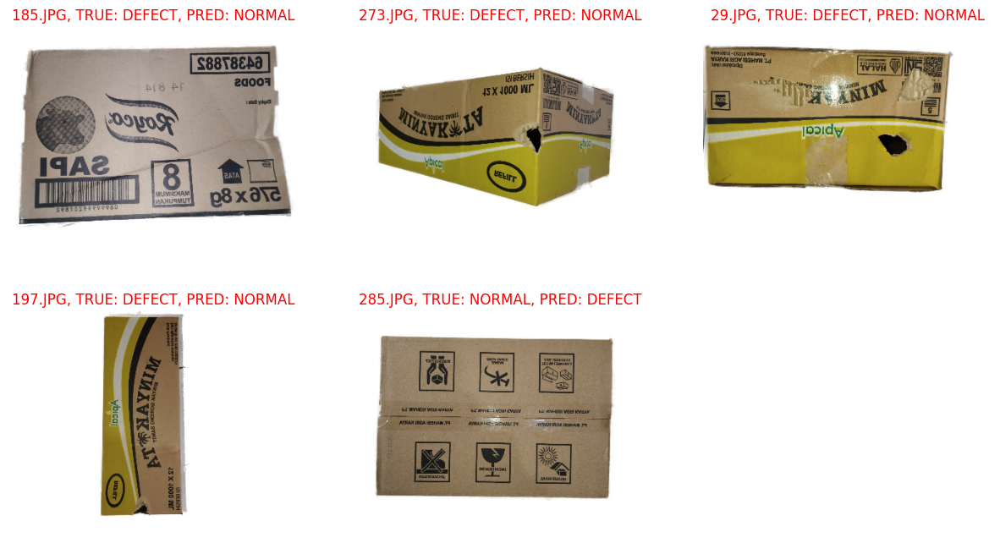

In [ ]:
# zip semua image dan datanya yang miss predict
miss_predict = list(
    filter(lambda x: x[2] != x[3], zip(image_name['test'], images['test'], y_true, y_pred))
)

# inisialisasi category
category = {0: "normal", 1: "defect"}
col = 3
row = (
    len(miss_predict) // col + 1
    if len(miss_predict) % col != 0
    else len(miss_predict) // col
)

# buat plot dengan 4 kolom dan n baris
fig, ax = plt.subplots(row, col, figsize=(5 * col, 4 * row))
for i in ax:
    for j in i:
        j.axis("off")
for r in range(row):

    # ambil 4 data untuk setiap baris untuk ditampilkan
    miss_temp = miss_predict[r * col : (r + 1) * col]
    for c, (im_name, im, label, pred) in enumerate(miss_temp):

        # kembalikan flatten image ke size aslinya
        im = im.reshape(300, 400, -1)
        label = category[label]
        pred = category[pred]

        # tampilkan citra yang miss predict
        ax[r][c].imshow(im)
        ax[r][c].set_title(
            f"{im_name}, True: {label}, Pred: {pred}".upper(),
            color="red",
            horizontalalignment="center",
            transform=ax[r][c].transAxes,
        )
        for i in range(1):
            fig, ax1 = plt.subplots(1, 1, figsize=(5, 4))
            ax1.axis("off")

            # tampilkan citra pada plot dan set untuk titlenya
            ax1.imshow(im)
            ax1.set_title(
                f"{im_name}, True: {label}, Pred: {pred}".upper(),
                color="red",
                horizontalalignment="center",
                transform=ax1.transAxes,
            )

            # export citra ke directory buat_laporan
            os.makedirs(f"buat_laporan/cnn/{label}", exist_ok=True)
            plt.savefig(f"buat_laporan/cnn/{label}/{im_name}")
            plt.close()

In [ ]:
# save model ke drive (KHUSUS GOOGLE COLAB)
from google.colab import drive
drive.mount("drive")
model.save("/content/drive/MyDrive/object_detection_cardboard/cnn_unet.h5")

Mounted at drive
